<div style="position:relative; width:100%;">
  <!-- Logo absoluto en la esquina superior derecha (encima del título) -->
  <img src="../assets/OsGeolab.png"
       alt="Logo semillero"
       style="position:absolute; top:0; right:0; width:200px; z-index:50; pointer-events:none;">
    <img src="../assets/Ud.png"
       alt="Logo ud"
       style="position:absolute; top:0; left:0; width:100px; z-index:50; pointer-events:none;">
  <!-- Título centrado; le damos padding-top para que el logo pueda quedar encima -->
  <h2 style="text-align:center; margin:0; padding-top:100px;">
    Estudio de viabilidad en la delimitación de coberturas con imágenes satelitales mediante el modelo Segment Anything: Comparación con la metodología CORINE Land Cover en el municipio de Guatavita.
  </h2>
</div>

<h2 style="text-align:center;" >Tutorial: Uso de prompts geometricos en la segmentacion</h2>

Autores:
*   **Cristian Stiven Florez Macias**
*   **Sergio Andres Escobar Eslava** 

In [1]:
!pip install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu118
!pip install segment-geospatial
!pip install segment-anything-hq

Looking in indexes: https://download.pytorch.org/whl/cu118


In [2]:
import geopandas as gpd
import rasterio
from rasterio import features
import os
import numpy as np
from samgeo.text_sam import LangSAM
import matplotlib.pyplot as plt
import cv2
import torch
from segment_anything_hq import sam_model_registry, SamPredictor
from typing import Dict

# Verificar que CUDA esté disponible
print(f"CUDA disponible: {torch.cuda.is_available()}")
print(f"Versión de PyTorch: {torch.__version__}")

CUDA disponible: True
Versión de PyTorch: 2.7.1+cu118


In [4]:
sam_checkpoint = "../model/sam_hq_vit_h.pth"
model_type = "vit_h"

sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)
sam.to(device="cuda")


<All keys matched successfully>


Sam(
  (image_encoder): ImageEncoderViT(
    (patch_embed): PatchEmbed(
      (proj): Conv2d(3, 1280, kernel_size=(16, 16), stride=(16, 16))
    )
    (blocks): ModuleList(
      (0-31): 32 x Block(
        (norm1): LayerNorm((1280,), eps=1e-06, elementwise_affine=True)
        (attn): Attention(
          (qkv): Linear(in_features=1280, out_features=3840, bias=True)
          (proj): Linear(in_features=1280, out_features=1280, bias=True)
        )
        (norm2): LayerNorm((1280,), eps=1e-06, elementwise_affine=True)
        (mlp): MLPBlock(
          (lin1): Linear(in_features=1280, out_features=5120, bias=True)
          (lin2): Linear(in_features=5120, out_features=1280, bias=True)
          (act): GELU(approximate='none')
        )
      )
    )
    (neck): Sequential(
      (0): Conv2d(1280, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (1): LayerNorm2d()
      (2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (3): LayerNorm2d

In [ ]:
predictor = SamPredictor(sam)
image_path = '../tiles/Sentinel/Guatavita_0_crop.tif'
point_coords_path = '../tiles/Puntos/Guatavita_0_points.geojson'
raster = rasterio.open(image_path)
image = raster.read().transpose(1, 2, 0)
predictor.set_image(image)

# 1) Leer el CRS del raster de referencia
with rasterio.open(image_path) as src:
    raster_crs = src.crs
    
# 2) Leer puntos y reproyectar al CRS del raster (evita conflictos PROJ)
gdf = gpd.read_file(point_coords_path)
if gdf.crs is None:
    gdf = gdf.set_crs("EPSG:4326")

# Convertir coordenadas geográficas a píxeles del raster
from rasterio.transform import rowcol
with rasterio.open(image_path) as src:
    lons = gdf.geometry.x.values
    lats = gdf.geometry.y.values
    rows, cols = rowcol(src.transform, lons, lats)
    point_coords = np.column_stack([cols, rows])  # (N, 2) formato [x_pixel, y_pixel]

print(f"📍 Puntos en píxeles: {point_coords}")

# Capturar las máscaras devueltas
masks, scores, logits = predictor.predict(
    point_coords=point_coords,
    point_labels=np.array([1, 1, 1]),
    multimask_output=True  # Genera 3 máscaras por punto
)

print(f"✅ Generadas {masks.shape[0]} máscaras con scores: {scores}")

# Visualizar solo la mejor máscara sin puntos
fig, ax = plt.subplots(1, 1, figsize=(10, 10))

# Mejor máscara (mayor score)
best_mask_idx = np.argmax(scores)
ax.imshow(image)
ax.imshow(masks[best_mask_idx], alpha=0.5, cmap='Reds')
ax.set_title(f'Máscara segmentada (score: {scores[best_mask_idx]:.3f})')
ax.axis('off')

plt.tight_layout()
plt.show()


############################################################
🔄 Procesando tile 0 con código CORINE 512
############################################################

📍 SEGMENTACIÓN CON PUNTOS - Tile 0
   • Código CORINE: 512 - Cuerpos de agua
   • Imagen: ../tiles/Sentinel/Guatavita_0_crop.tif
   • Puntos: ../tiles/Puntos/Guatavita_0_points.geojson

📂 PASO 1: CARGA DE DATOS
   ✅ Cargados 3 puntos

🎯 PASO 2: SEGMENTACIÓN CON SAM
   ✅ Generadas 1 máscaras con scores: [0.96929336]
   💾 Máscara guardada: ../tiles/segmentation_points/Guatavita_0_points_mask.tif

🗺️ PASO 3: CONVERSIÓN GEOJSON A RASTER
   ✅ Ground truth generado: ../tiles/LandUseRaster/Guatavita_0_codigo512_raster.tif

📊 PASO 4: CÁLCULO DE MÉTRICAS


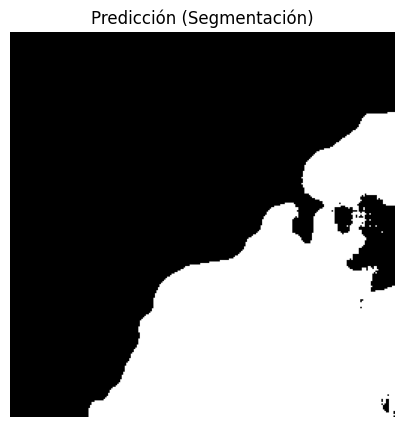

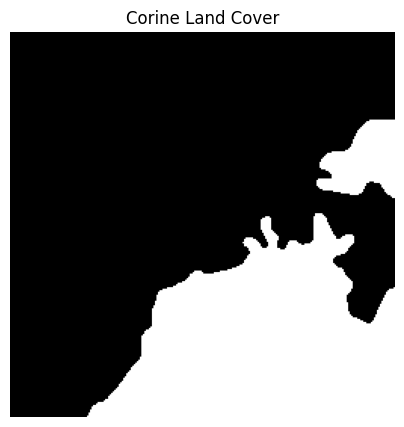

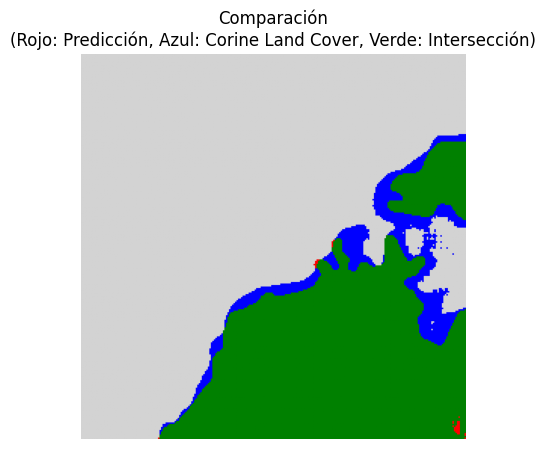

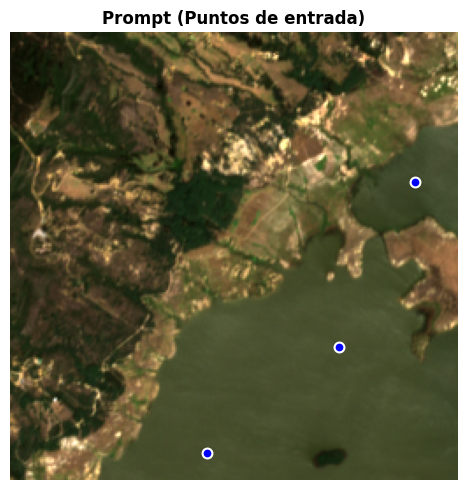


🎯 MÉTRICAS PRINCIPALES:
   • IoU (Intersection over Union): 85.19%
   • DICE Coefficient:              92.00%
   • Pixel Accuracy:                94.94%
   • F1-Score:                      92.00%

📊 SENSIBILIDAD Y ESPECIFICIDAD:
   • TPR (Sensitivity / Recall):    99.74%
   • FPR (False Positive Rate):     7.05%
   • Precision:                     85.37%

🔢 MATRIZ DE CONFUSIÓN:
   • True Positives (TP):           18935
   • False Positives (FP):          3244
   • True Negatives (TN):           42797
   • False Negatives (FN):          49

############################################################
🔄 Procesando tile 1 con código CORINE 512
############################################################

📍 SEGMENTACIÓN CON PUNTOS - Tile 1
   • Código CORINE: 512 - Cuerpos de agua
   • Imagen: ../tiles/Sentinel/Guatavita_1_crop.tif
   • Puntos: ../tiles/Puntos/Guatavita_1_points.geojson

📂 PASO 1: CARGA DE DATOS
   ✅ Cargados 5 puntos

🎯 PASO 2: SEGMENTACIÓN CON SAM
   ✅ Generadas 1 másca

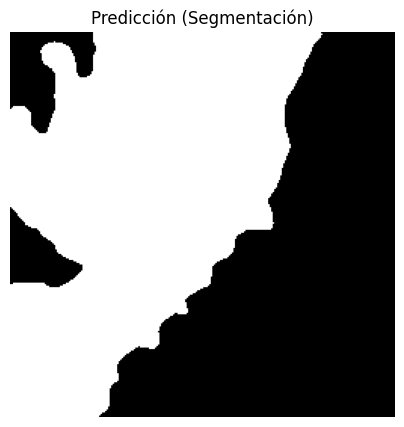

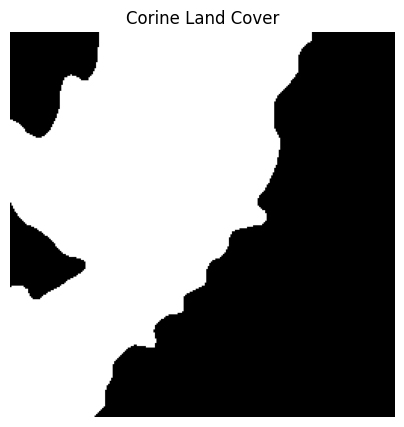

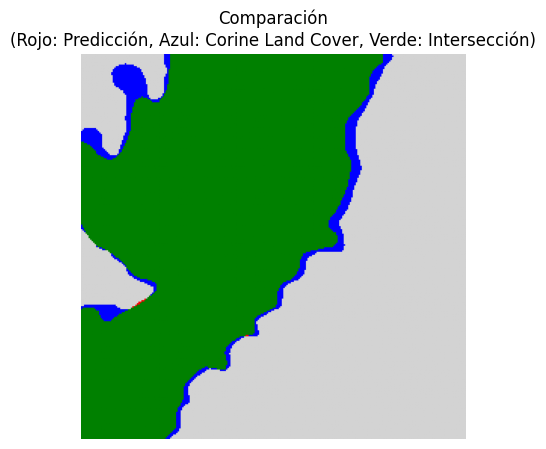

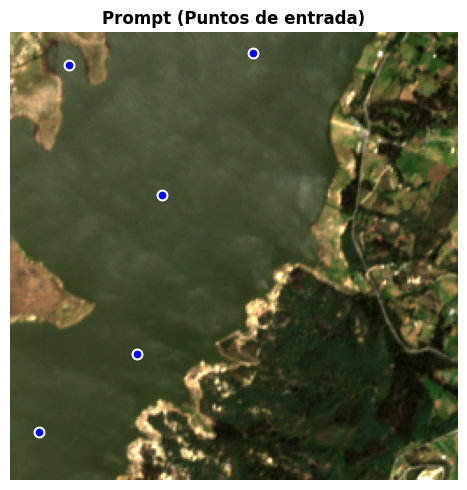


🎯 MÉTRICAS PRINCIPALES:
   • IoU (Intersection over Union): 93.05%
   • DICE Coefficient:              96.40%
   • Pixel Accuracy:                96.40%
   • F1-Score:                      96.40%

📊 SENSIBILIDAD Y ESPECIFICIDAD:
   • TPR (Sensitivity / Recall):    99.96%
   • FPR (False Positive Rate):     6.94%
   • Precision:                     93.08%

🔢 MATRIZ DE CONFUSIÓN:
   • True Positives (TP):           31387
   • False Positives (FP):          2333
   • True Negatives (TN):           31294
   • False Negatives (FN):          11

############################################################
🔄 Procesando tile 2 con código CORINE 512
############################################################

📍 SEGMENTACIÓN CON PUNTOS - Tile 2
   • Código CORINE: 512 - Cuerpos de agua
   • Imagen: ../tiles/Sentinel/Guatavita_2_crop.tif
   • Puntos: ../tiles/Puntos/Guatavita_2_points.geojson

📂 PASO 1: CARGA DE DATOS
   ✅ Cargados 2 puntos

🎯 PASO 2: SEGMENTACIÓN CON SAM
   ✅ Generadas 1 másca

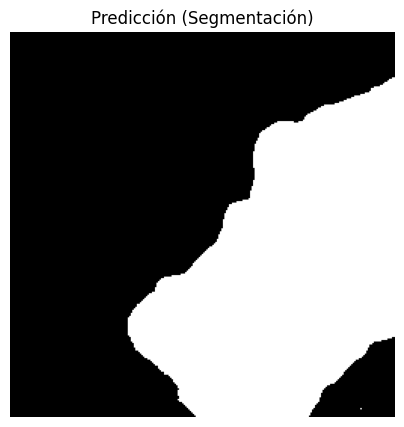

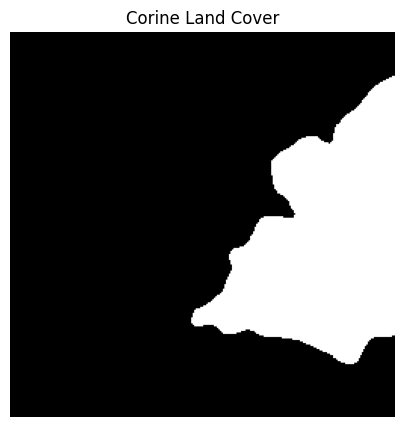

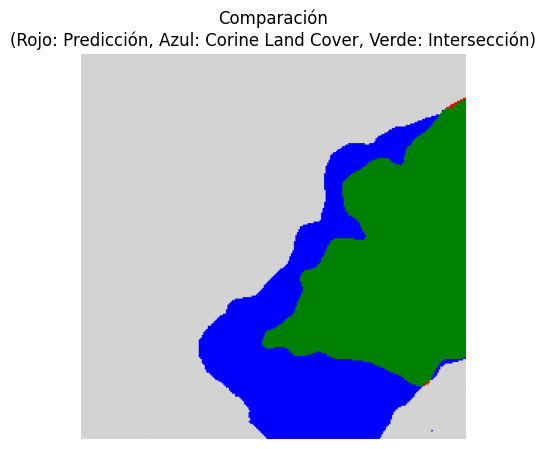

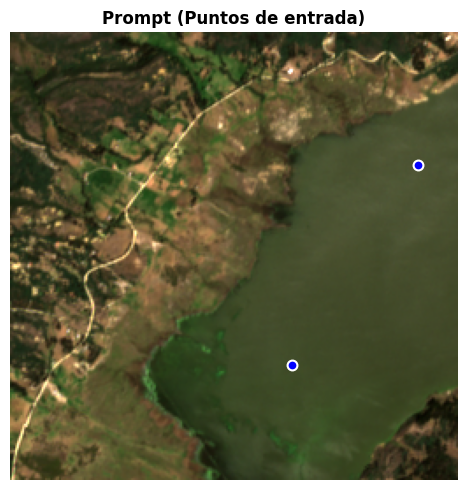


🎯 MÉTRICAS PRINCIPALES:
   • IoU (Intersection over Union): 57.29%
   • DICE Coefficient:              72.84%
   • Pixel Accuracy:                83.63%
   • F1-Score:                      72.84%

📊 SENSIBILIDAD Y ESPECIFICIDAD:
   • TPR (Sensitivity / Recall):    99.84%
   • FPR (False Positive Rate):     20.94%
   • Precision:                     57.34%

🔢 MATRIZ DE CONFUSIÓN:
   • True Positives (TP):           14276
   • False Positives (FP):          10621
   • True Negatives (TN):           40105
   • False Negatives (FN):          23

############################################################
🔄 Procesando tile 3 con código CORINE 512
############################################################

📍 SEGMENTACIÓN CON PUNTOS - Tile 3
   • Código CORINE: 512 - Cuerpos de agua
   • Imagen: ../tiles/Sentinel/Guatavita_3_crop.tif
   • Puntos: ../tiles/Puntos/Guatavita_3_points.geojson

📂 PASO 1: CARGA DE DATOS
   ✅ Cargados 4 puntos

🎯 PASO 2: SEGMENTACIÓN CON SAM
   ✅ Generadas 1 más

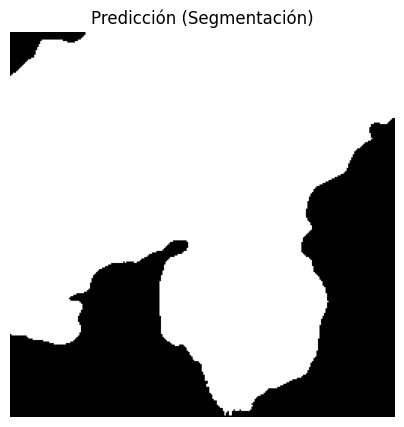

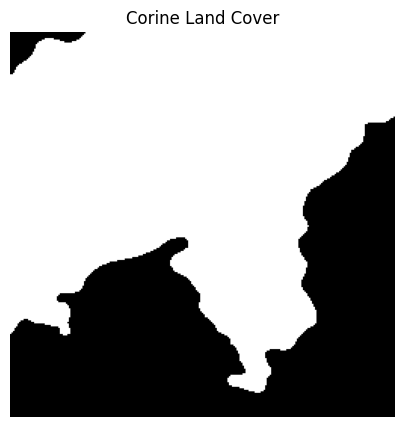

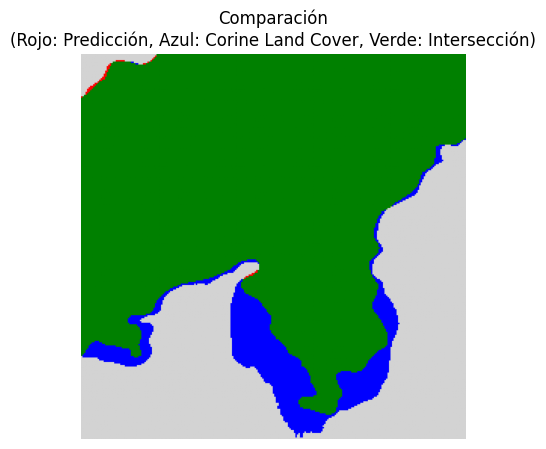

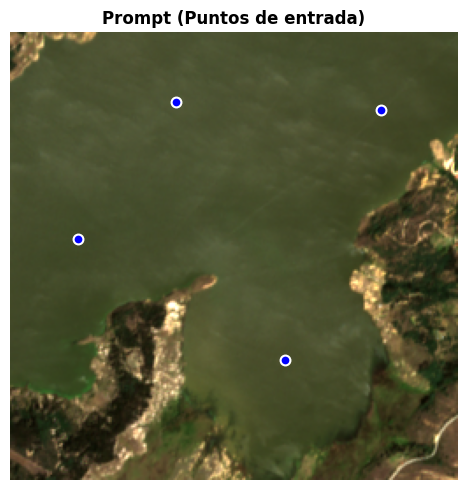


🎯 MÉTRICAS PRINCIPALES:
   • IoU (Intersection over Union): 89.17%
   • DICE Coefficient:              94.27%
   • Pixel Accuracy:                92.52%
   • F1-Score:                      94.27%

📊 SENSIBILIDAD Y ESPECIFICIDAD:
   • TPR (Sensitivity / Recall):    99.84%
   • FPR (False Positive Rate):     19.27%
   • Precision:                     89.30%

🔢 MATRIZ DE CONFUSIÓN:
   • True Positives (TP):           40052
   • False Positives (FP):          4799
   • True Negatives (TN):           20108
   • False Negatives (FN):          66

############################################################
🔄 Procesando tile 4 con código CORINE 111
############################################################

📍 SEGMENTACIÓN CON PUNTOS - Tile 4
   • Código CORINE: 111 - Tejido urbano continuo
   • Imagen: ../tiles/Sentinel/Guatavita_4_crop.tif
   • Puntos: ../tiles/Puntos/Guatavita_4_points.geojson

📂 PASO 1: CARGA DE DATOS
   ✅ Cargados 3 puntos

🎯 PASO 2: SEGMENTACIÓN CON SAM
   ✅ Generadas

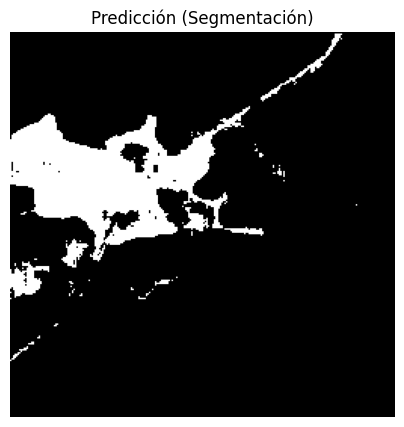

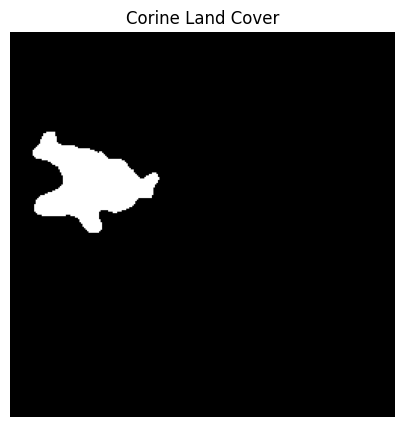

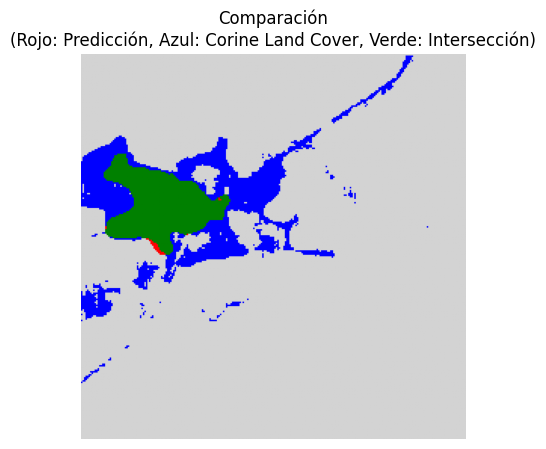

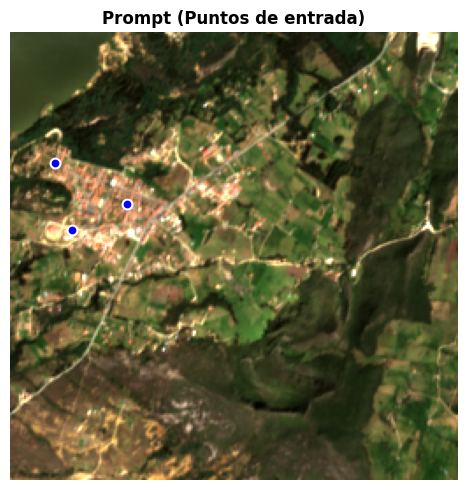


🎯 MÉTRICAS PRINCIPALES:
   • IoU (Intersection over Union): 35.19%
   • DICE Coefficient:              52.06%
   • Pixel Accuracy:                92.11%
   • F1-Score:                      52.06%

📊 SENSIBILIDAD Y ESPECIFICIDAD:
   • TPR (Sensitivity / Recall):    98.55%
   • FPR (False Positive Rate):     8.18%
   • Precision:                     35.37%

🔢 MATRIZ DE CONFUSIÓN:
   • True Positives (TP):           2784
   • False Positives (FP):          5087
   • True Negatives (TN):           57113
   • False Negatives (FN):          41

############################################################
🔄 Procesando tile 5 con código CORINE 231
############################################################

📍 SEGMENTACIÓN CON PUNTOS - Tile 5
   • Código CORINE: 231 - Pastos limpios
   • Imagen: ../tiles/Sentinel/Guatavita_5_crop.tif
   • Puntos: ../tiles/Puntos/Guatavita_5_points.geojson

📂 PASO 1: CARGA DE DATOS
   ✅ Cargados 8 puntos

🎯 PASO 2: SEGMENTACIÓN CON SAM
   ✅ Generadas 1 máscara

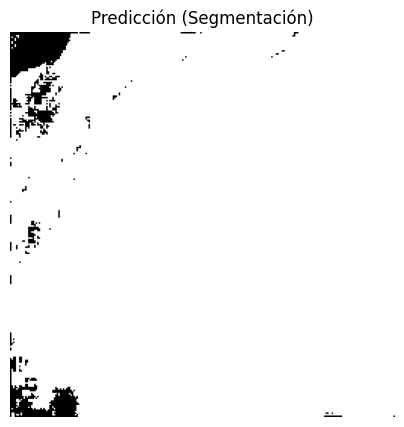

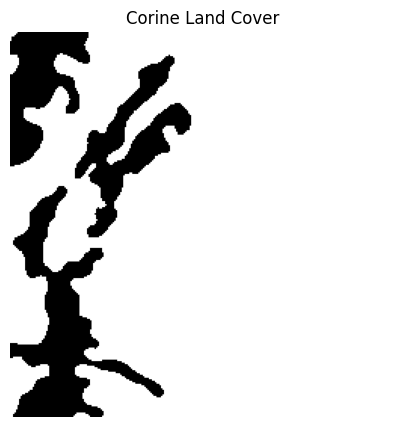

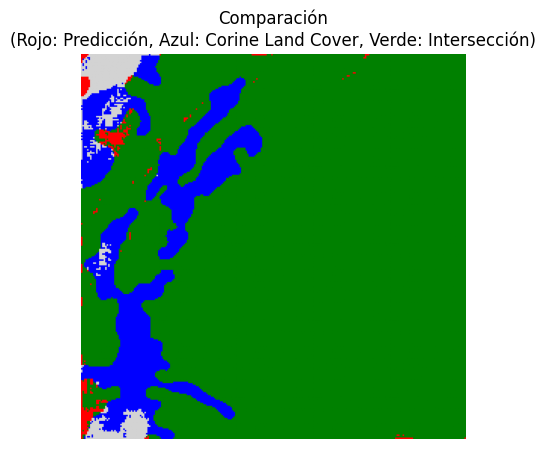

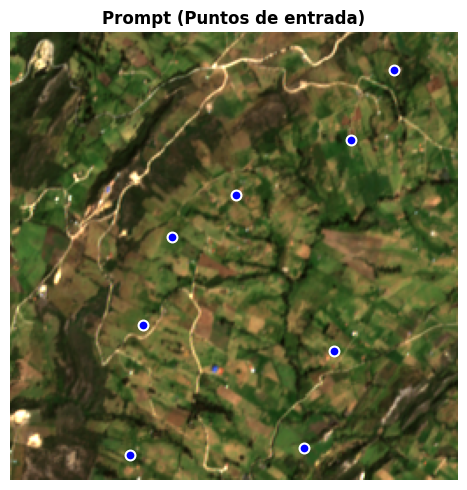


🎯 MÉTRICAS PRINCIPALES:
   • IoU (Intersection over Union): 85.89%
   • DICE Coefficient:              92.41%
   • Pixel Accuracy:                86.25%
   • F1-Score:                      92.41%

📊 SENSIBILIDAD Y ESPECIFICIDAD:
   • TPR (Sensitivity / Recall):    98.94%
   • FPR (False Positive Rate):     83.46%
   • Precision:                     86.69%

🔢 MATRIZ DE CONFUSIÓN:
   • True Positives (TP):           54428
   • False Positives (FP):          8357
   • True Negatives (TN):           1656
   • False Negatives (FN):          584

############################################################
🔄 Procesando tile 6 con código CORINE 231
############################################################

📍 SEGMENTACIÓN CON PUNTOS - Tile 6
   • Código CORINE: 231 - Pastos limpios
   • Imagen: ../tiles/Sentinel/Guatavita_6_crop.tif
   • Puntos: ../tiles/Puntos/Guatavita_6_points.geojson

📂 PASO 1: CARGA DE DATOS
   ✅ Cargados 10 puntos

🎯 PASO 2: SEGMENTACIÓN CON SAM
   ✅ Generadas 1 másc

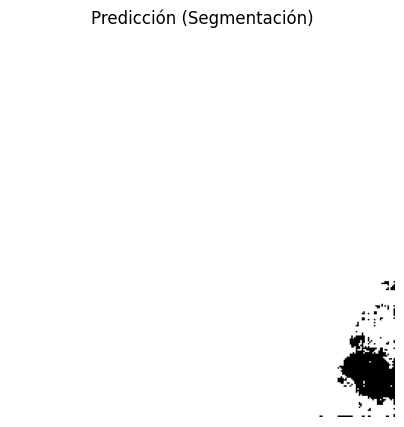

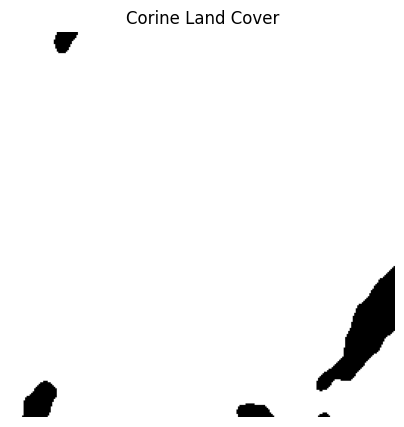

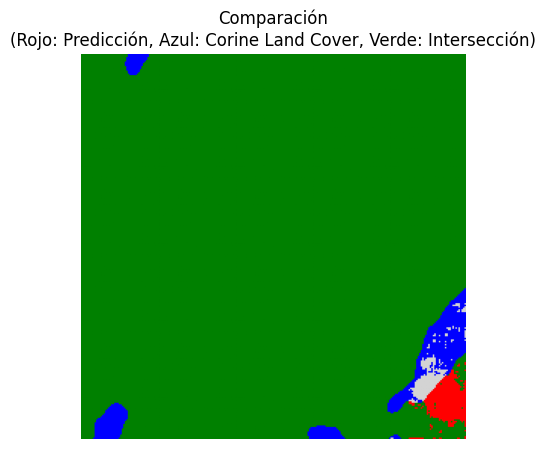

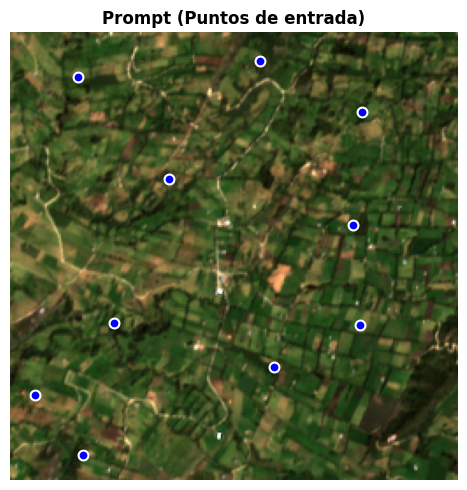


🎯 MÉTRICAS PRINCIPALES:
   • IoU (Intersection over Union): 95.90%
   • DICE Coefficient:              97.91%
   • Pixel Accuracy:                95.92%
   • F1-Score:                      97.91%

📊 SENSIBILIDAD Y ESPECIFICIDAD:
   • TPR (Sensitivity / Recall):    98.86%
   • FPR (False Positive Rate):     82.79%
   • Precision:                     96.97%

🔢 MATRIZ DE CONFUSIÓN:
   • True Positives (TP):           61973
   • False Positives (FP):          1934
   • True Negatives (TN):           402
   • False Negatives (FN):          716

############################################################
🔄 Procesando tile 7 con código CORINE 321113
############################################################

📍 SEGMENTACIÓN CON PUNTOS - Tile 7
   • Código CORINE: 321113 - Herbazal denso de tierra firme con arbustos
   • Imagen: ../tiles/Sentinel/Guatavita_7_crop.tif
   • Puntos: ../tiles/Puntos/Guatavita_7_points.geojson

📂 PASO 1: CARGA DE DATOS
   ✅ Cargados 12 puntos

🎯 PASO 2: SEGMENTA

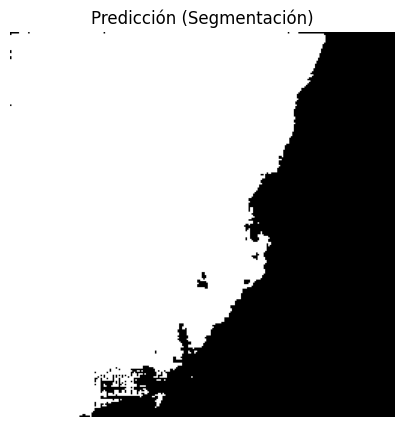

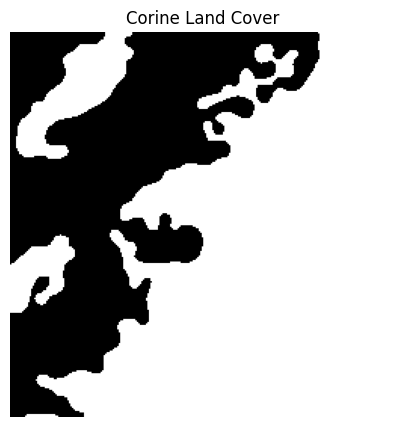

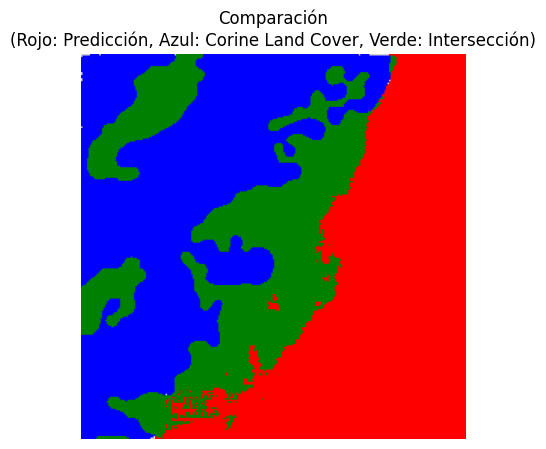

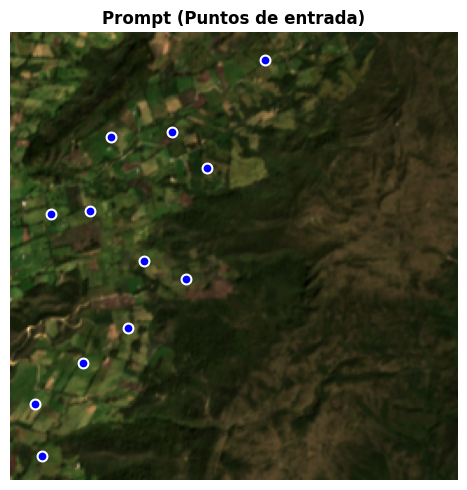


🎯 MÉTRICAS PRINCIPALES:
   • IoU (Intersection over Union): 25.38%
   • DICE Coefficient:              40.48%
   • Pixel Accuracy:                25.42%
   • F1-Score:                      40.48%

📊 SENSIBILIDAD Y ESPECIFICIDAD:
   • TPR (Sensitivity / Recall):    39.53%
   • FPR (False Positive Rate):     99.85%
   • Precision:                     41.48%

🔢 MATRIZ DE CONFUSIÓN:
   • True Positives (TP):           16493
   • False Positives (FP):          23266
   • True Negatives (TN):           35
   • False Negatives (FN):          25231

############################################################
🔄 Procesando tile 8 con código CORINE 321113
############################################################

📍 SEGMENTACIÓN CON PUNTOS - Tile 8
   • Código CORINE: 321113 - Herbazal denso de tierra firme con arbustos
   • Imagen: ../tiles/Sentinel/Guatavita_8_crop.tif
   • Puntos: ../tiles/Puntos/Guatavita_8_points.geojson

📂 PASO 1: CARGA DE DATOS
   ✅ Cargados 12 puntos

🎯 PASO 2: SEGMEN

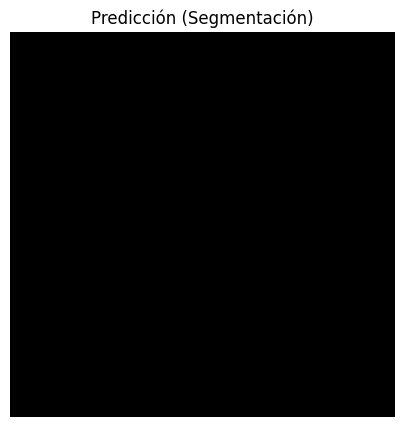

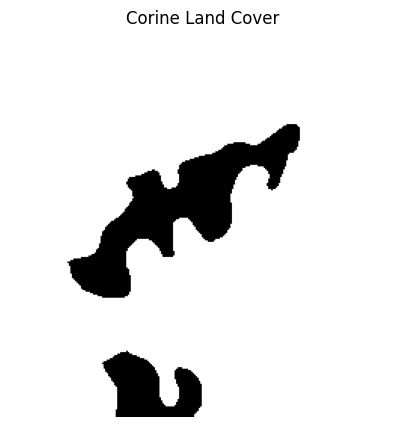

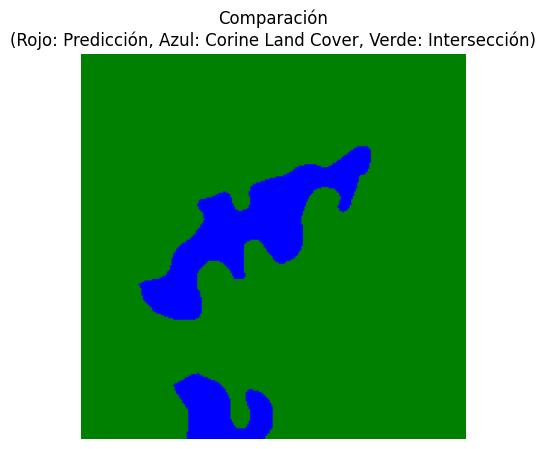

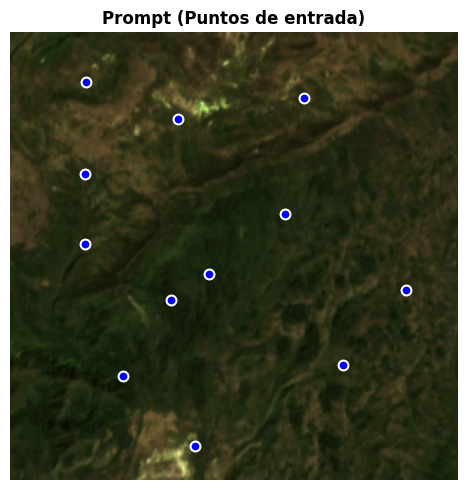


🎯 MÉTRICAS PRINCIPALES:
   • IoU (Intersection over Union): 88.67%
   • DICE Coefficient:              94.00%
   • Pixel Accuracy:                88.67%
   • F1-Score:                      94.00%

📊 SENSIBILIDAD Y ESPECIFICIDAD:
   • TPR (Sensitivity / Recall):    100.00%
   • FPR (False Positive Rate):     100.00%
   • Precision:                     88.67%

🔢 MATRIZ DE CONFUSIÓN:
   • True Positives (TP):           57658
   • False Positives (FP):          7367
   • True Negatives (TN):           0
   • False Negatives (FN):          0

############################################################
🔄 Procesando tile 9 con código CORINE 321113
############################################################

📍 SEGMENTACIÓN CON PUNTOS - Tile 9
   • Código CORINE: 321113 - Herbazal denso de tierra firme con arbustos
   • Imagen: ../tiles/Sentinel/Guatavita_9_crop.tif
   • Puntos: ../tiles/Puntos/Guatavita_9_points.geojson

📂 PASO 1: CARGA DE DATOS
   ✅ Cargados 9 puntos

🎯 PASO 2: SEGMENTACIÓ

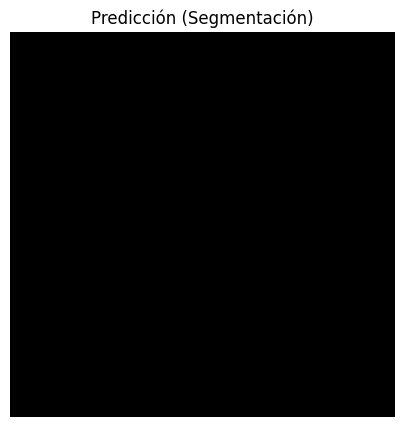

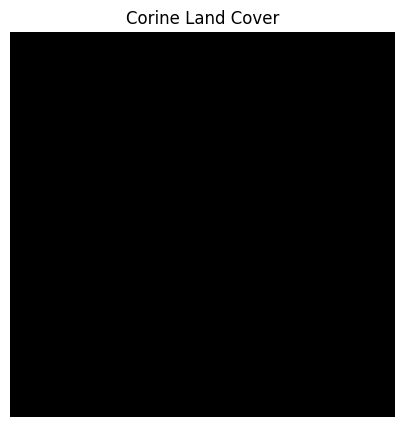

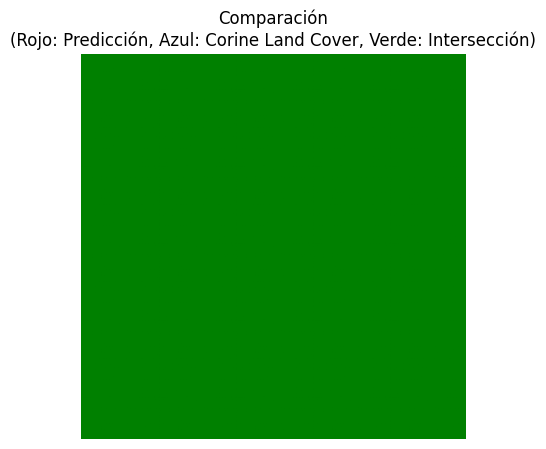

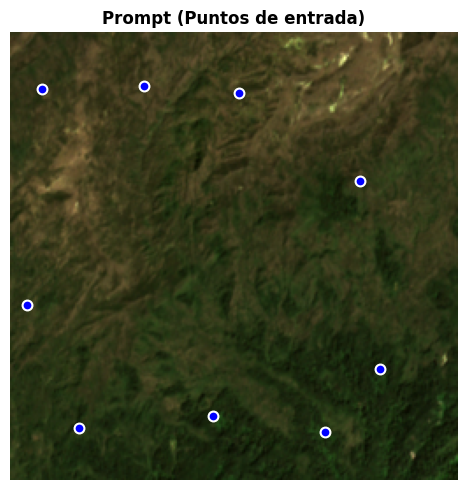


🎯 MÉTRICAS PRINCIPALES:
   • IoU (Intersection over Union): 100.00%
   • DICE Coefficient:              100.00%
   • Pixel Accuracy:                100.00%
   • F1-Score:                      100.00%

📊 SENSIBILIDAD Y ESPECIFICIDAD:
   • TPR (Sensitivity / Recall):    100.00%
   • FPR (False Positive Rate):     0.00%
   • Precision:                     100.00%

🔢 MATRIZ DE CONFUSIÓN:
   • True Positives (TP):           65025
   • False Positives (FP):          0
   • True Negatives (TN):           0
   • False Negatives (FN):          0

############################################################
🔄 Procesando tile 10 con código CORINE 321113
############################################################

📍 SEGMENTACIÓN CON PUNTOS - Tile 10
   • Código CORINE: 321113 - Herbazal denso de tierra firme con arbustos
   • Imagen: ../tiles/Sentinel/Guatavita_10_crop.tif
   • Puntos: ../tiles/Puntos/Guatavita_10_points.geojson

📂 PASO 1: CARGA DE DATOS
   ✅ Cargados 17 puntos

🎯 PASO 2: SEGMEN

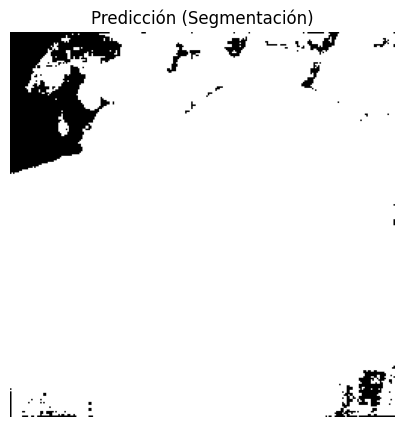

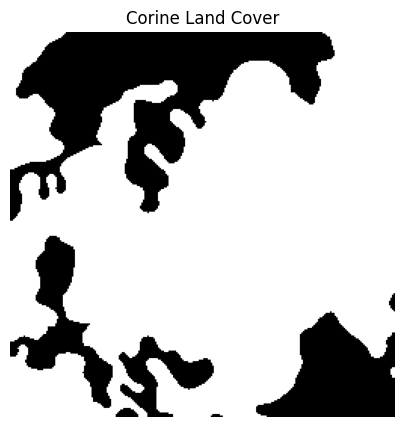

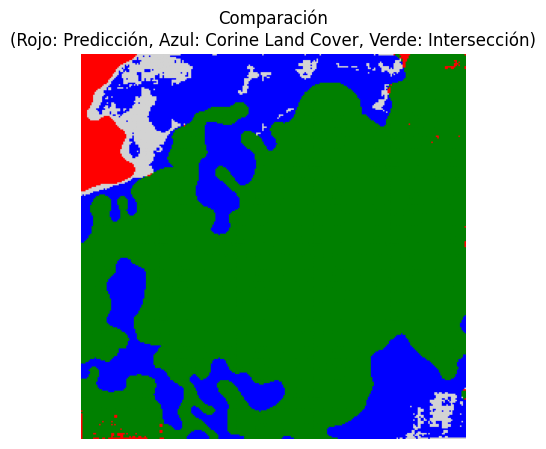

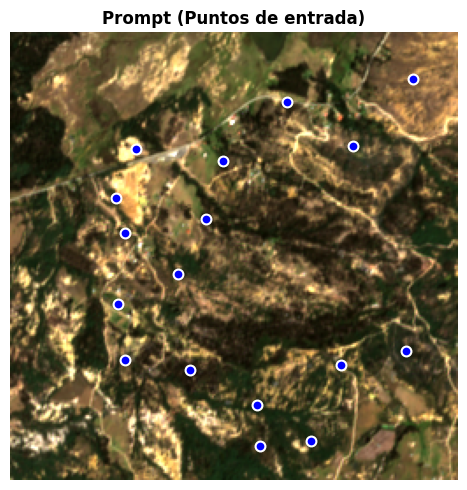


🎯 MÉTRICAS PRINCIPALES:
   • IoU (Intersection over Union): 71.20%
   • DICE Coefficient:              83.18%
   • Pixel Accuracy:                72.50%
   • F1-Score:                      83.18%

📊 SENSIBILIDAD Y ESPECIFICIDAD:
   • TPR (Sensitivity / Recall):    95.35%
   • FPR (False Positive Rate):     84.29%
   • Precision:                     73.76%

🔢 MATRIZ DE CONFUSIÓN:
   • True Positives (TP):           44210
   • False Positives (FP):          15729
   • True Negatives (TN):           2931
   • False Negatives (FN):          2155

############################################################
🔄 Procesando tile 11 con código CORINE 321113
############################################################

📍 SEGMENTACIÓN CON PUNTOS - Tile 11
   • Código CORINE: 321113 - Herbazal denso de tierra firme con arbustos
   • Imagen: ../tiles/Sentinel/Guatavita_11_crop.tif
   • Puntos: ../tiles/Puntos/Guatavita_11_points.geojson

📂 PASO 1: CARGA DE DATOS
   ✅ Cargados 14 puntos

🎯 PASO 2: S

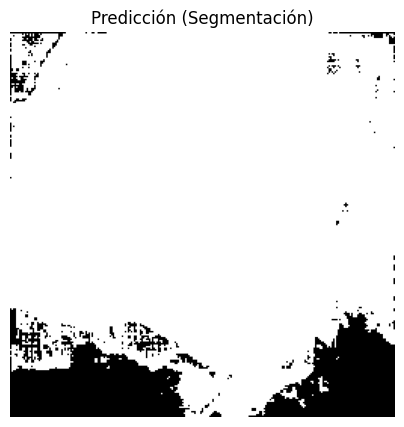

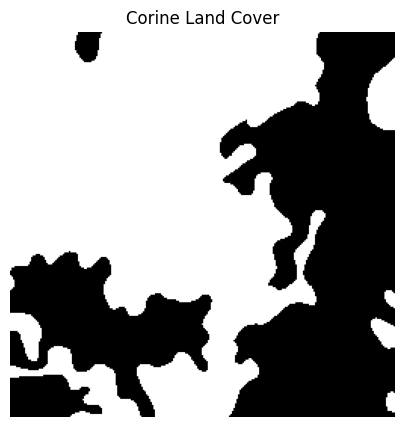

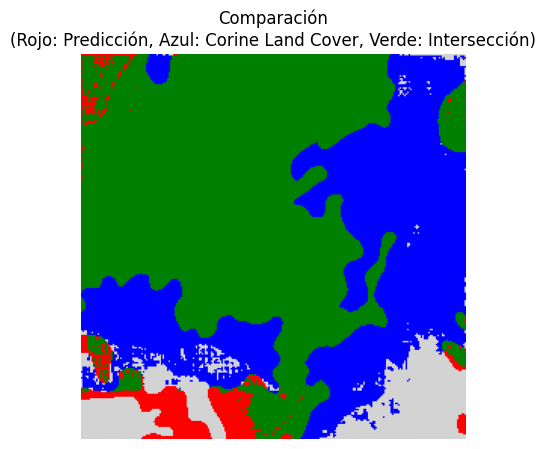

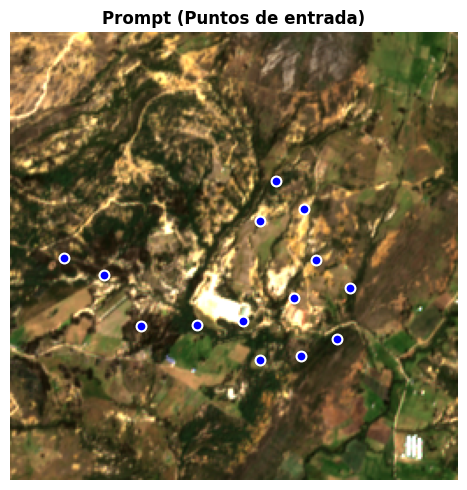


🎯 MÉTRICAS PRINCIPALES:
   • IoU (Intersection over Union): 58.38%
   • DICE Coefficient:              73.72%
   • Pixel Accuracy:                62.52%
   • F1-Score:                      73.72%

📊 SENSIBILIDAD Y ESPECIFICIDAD:
   • TPR (Sensitivity / Recall):    92.61%
   • FPR (False Positive Rate):     77.00%
   • Precision:                     61.23%

🔢 MATRIZ DE CONFUSIÓN:
   • True Positives (TP):           34185
   • False Positives (FP):          21646
   • True Negatives (TN):           6467
   • False Negatives (FN):          2727

############################################################
🔄 Procesando tile 12 con código CORINE 321113
############################################################

📍 SEGMENTACIÓN CON PUNTOS - Tile 12
   • Código CORINE: 321113 - Herbazal denso de tierra firme con arbustos
   • Imagen: ../tiles/Sentinel/Guatavita_12_crop.tif
   • Puntos: ../tiles/Puntos/Guatavita_12_points.geojson

📂 PASO 1: CARGA DE DATOS
   ✅ Cargados 17 puntos

🎯 PASO 2: S

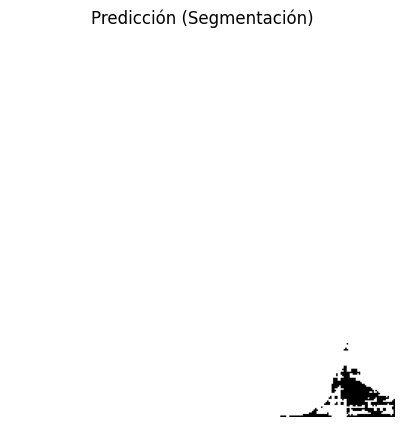

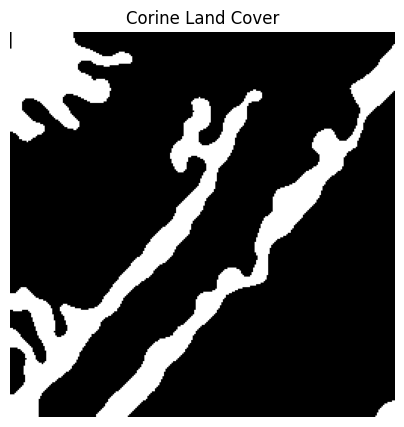

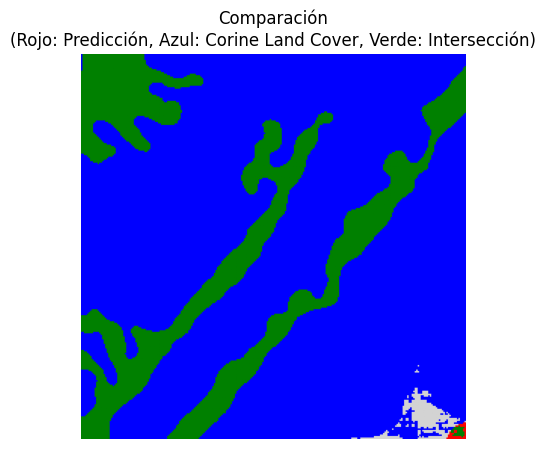

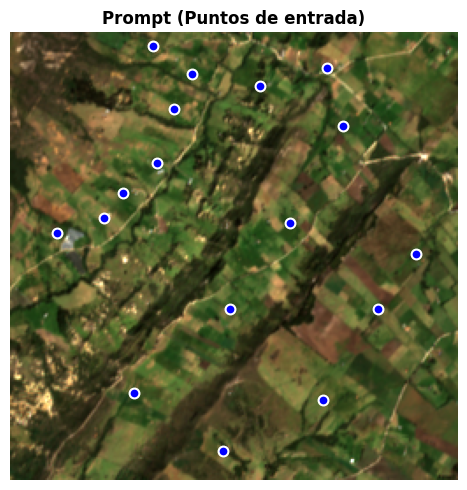


🎯 MÉTRICAS PRINCIPALES:
   • IoU (Intersection over Union): 20.41%
   • DICE Coefficient:              33.89%
   • Pixel Accuracy:                21.19%
   • F1-Score:                      33.89%

📊 SENSIBILIDAD Y ESPECIFICIDAD:
   • TPR (Sensitivity / Recall):    99.58%
   • FPR (False Positive Rate):     98.77%
   • Precision:                     20.42%

🔢 MATRIZ DE CONFUSIÓN:
   • True Positives (TP):           13138
   • False Positives (FP):          51192
   • True Negatives (TN):           639
   • False Negatives (FN):          56

############################################################
🔄 Procesando tile 13 con código CORINE 231
############################################################

📍 SEGMENTACIÓN CON PUNTOS - Tile 13
   • Código CORINE: 231 - Pastos limpios
   • Imagen: ../tiles/Sentinel/Guatavita_13_crop.tif
   • Puntos: ../tiles/Puntos/Guatavita_13_points.geojson

📂 PASO 1: CARGA DE DATOS
   ✅ Cargados 23 puntos

🎯 PASO 2: SEGMENTACIÓN CON SAM
   ✅ Generadas 1 m

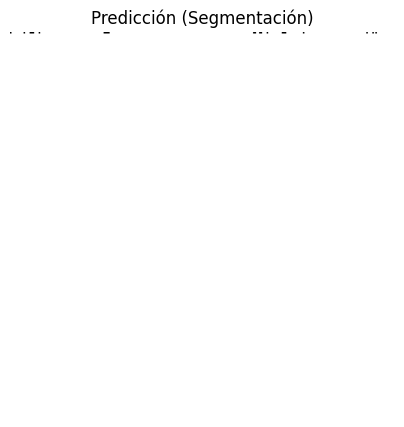

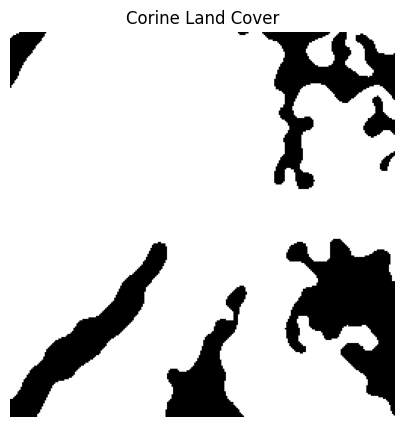

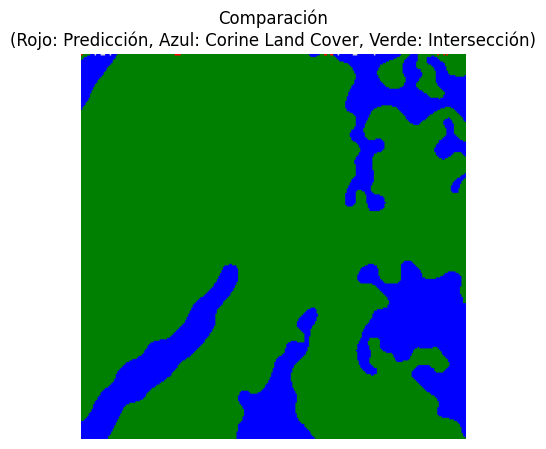

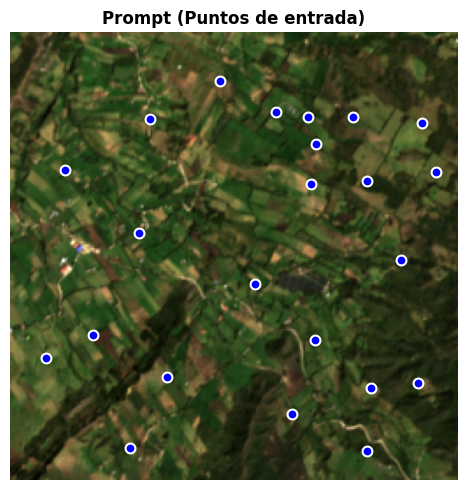


🎯 MÉTRICAS PRINCIPALES:
   • IoU (Intersection over Union): 80.17%
   • DICE Coefficient:              88.99%
   • Pixel Accuracy:                80.17%
   • F1-Score:                      88.99%

📊 SENSIBILIDAD Y ESPECIFICIDAD:
   • TPR (Sensitivity / Recall):    99.98%
   • FPR (False Positive Rate):     99.92%
   • Precision:                     80.18%

🔢 MATRIZ DE CONFUSIÓN:
   • True Positives (TP):           52121
   • False Positives (FP):          12882
   • True Negatives (TN):           10
   • False Negatives (FN):          12

############################################################
🔄 Procesando tile 14 con código CORINE 321113
############################################################

📍 SEGMENTACIÓN CON PUNTOS - Tile 14
   • Código CORINE: 321113 - Herbazal denso de tierra firme con arbustos
   • Imagen: ../tiles/Sentinel/Guatavita_14_crop.tif
   • Puntos: ../tiles/Puntos/Guatavita_14_points.geojson

📂 PASO 1: CARGA DE DATOS
   ✅ Cargados 13 puntos

🎯 PASO 2: SEGME

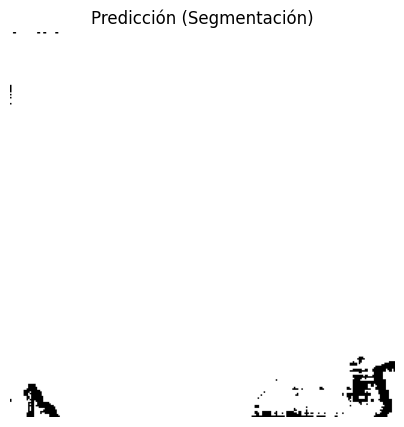

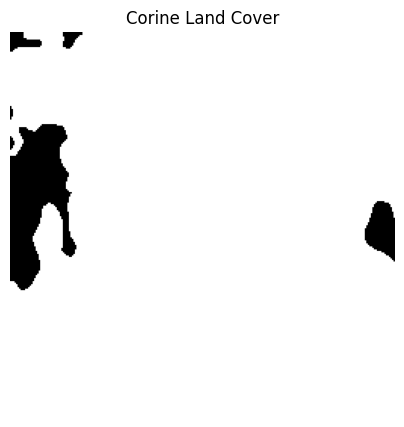

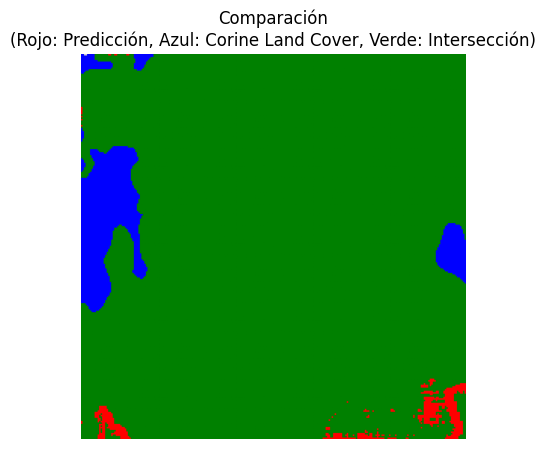

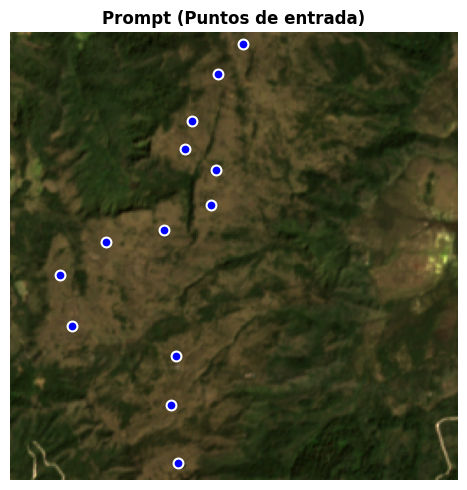


🎯 MÉTRICAS PRINCIPALES:
   • IoU (Intersection over Union): 92.73%
   • DICE Coefficient:              96.23%
   • Pixel Accuracy:                92.73%
   • F1-Score:                      96.23%

📊 SENSIBILIDAD Y ESPECIFICIDAD:
   • TPR (Sensitivity / Recall):    98.48%
   • FPR (False Positive Rate):     99.95%
   • Precision:                     94.08%

🔢 MATRIZ DE CONFUSIÓN:
   • True Positives (TP):           60298
   • False Positives (FP):          3797
   • True Negatives (TN):           2
   • False Negatives (FN):          928

############################################################
🔄 Procesando tile 15 con código CORINE 231
############################################################

📍 SEGMENTACIÓN CON PUNTOS - Tile 15
   • Código CORINE: 231 - Pastos limpios
   • Imagen: ../tiles/Sentinel/Guatavita_15_crop.tif
   • Puntos: ../tiles/Puntos/Guatavita_15_points.geojson

📂 PASO 1: CARGA DE DATOS
   ✅ Cargados 11 puntos

🎯 PASO 2: SEGMENTACIÓN CON SAM
   ✅ Generadas 1 más

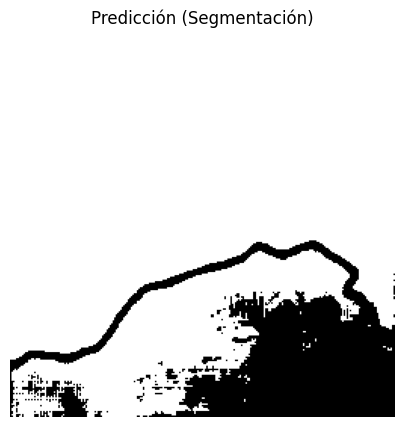

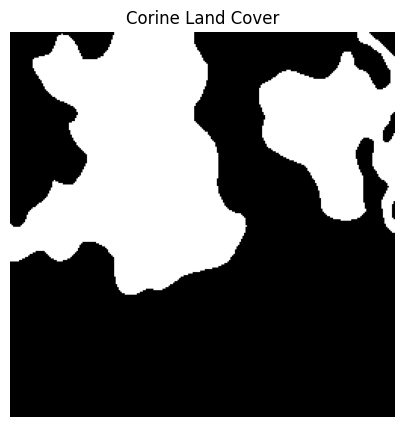

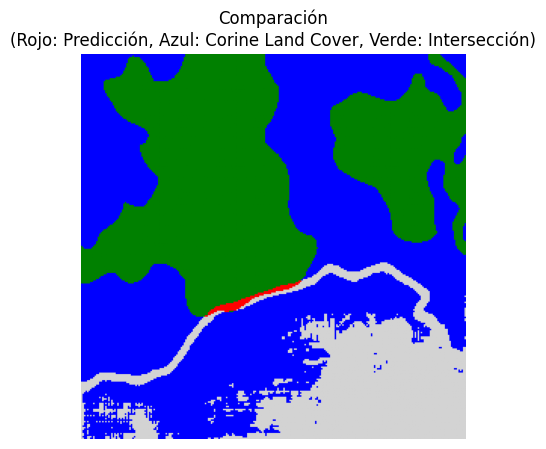

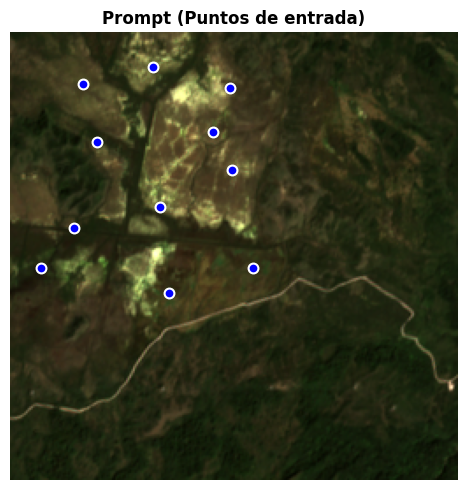


🎯 MÉTRICAS PRINCIPALES:
   • IoU (Intersection over Union): 42.65%
   • DICE Coefficient:              59.80%
   • Pixel Accuracy:                52.20%
   • F1-Score:                      59.80%

📊 SENSIBILIDAD Y ESPECIFICIDAD:
   • TPR (Sensitivity / Recall):    99.10%
   • FPR (False Positive Rate):     74.04%
   • Precision:                     42.82%

🔢 MATRIZ DE CONFUSIÓN:
   • True Positives (TP):           23116
   • False Positives (FP):          30873
   • True Negatives (TN):           10826
   • False Negatives (FN):          210

############################################################
🔄 Procesando tile 16 con código CORINE 231
############################################################

📍 SEGMENTACIÓN CON PUNTOS - Tile 16
   • Código CORINE: 231 - Pastos limpios
   • Imagen: ../tiles/Sentinel/Guatavita_16_crop.tif
   • Puntos: ../tiles/Puntos/Guatavita_16_points.geojson

📂 PASO 1: CARGA DE DATOS
   ✅ Cargados 24 puntos

🎯 PASO 2: SEGMENTACIÓN CON SAM
   ✅ Generadas 

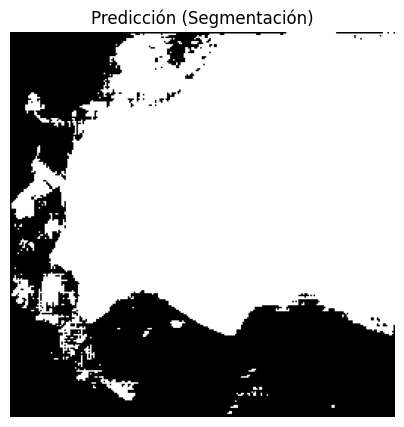

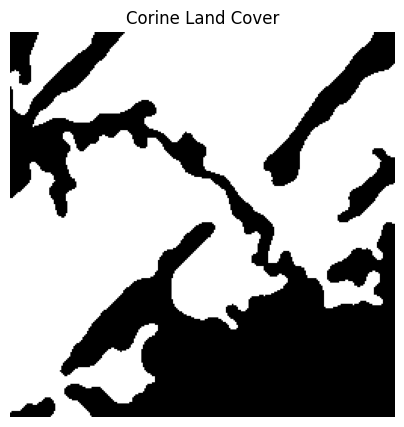

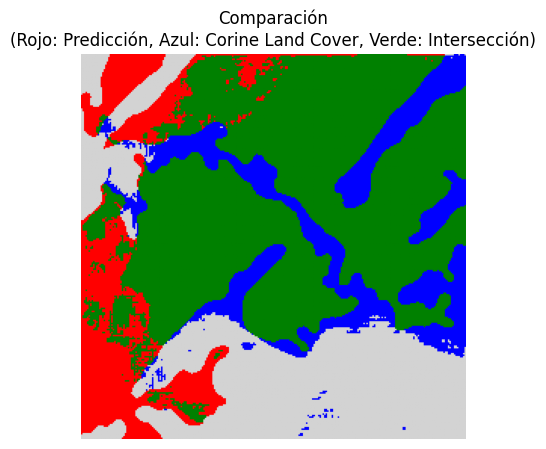

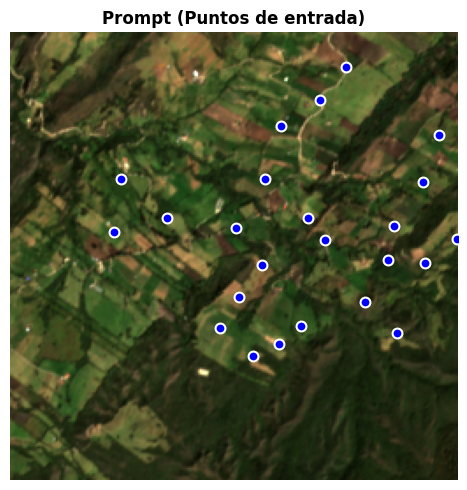


🎯 MÉTRICAS PRINCIPALES:
   • IoU (Intersection over Union): 63.83%
   • DICE Coefficient:              77.92%
   • Pixel Accuracy:                72.87%
   • F1-Score:                      77.92%

📊 SENSIBILIDAD Y ESPECIFICIDAD:
   • TPR (Sensitivity / Recall):    78.64%
   • FPR (False Positive Rate):     36.12%
   • Precision:                     77.21%

🔢 MATRIZ DE CONFUSIÓN:
   • True Positives (TP):           31132
   • False Positives (FP):          9188
   • True Negatives (TN):           16249
   • False Negatives (FN):          8456

############################################################
🔄 Procesando tile 17 con código CORINE 231
############################################################

📍 SEGMENTACIÓN CON PUNTOS - Tile 17
   • Código CORINE: 231 - Pastos limpios
   • Imagen: ../tiles/Sentinel/Guatavita_17_crop.tif
   • Puntos: ../tiles/Puntos/Guatavita_17_points.geojson

📂 PASO 1: CARGA DE DATOS
   ✅ Cargados 14 puntos

🎯 PASO 2: SEGMENTACIÓN CON SAM
   ✅ Generadas 

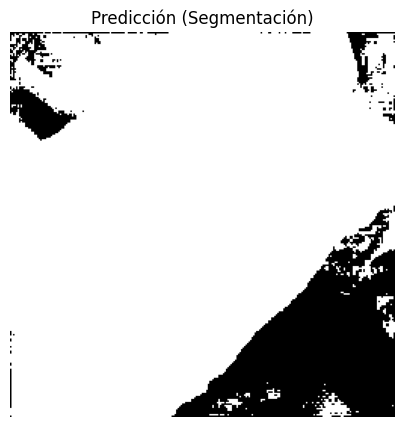

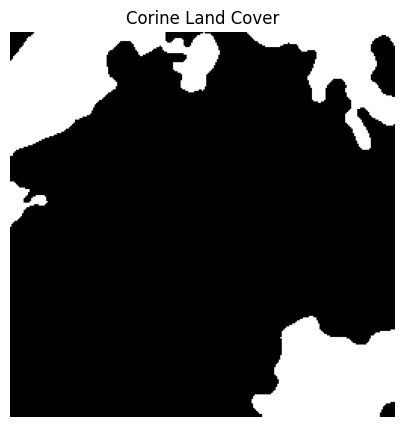

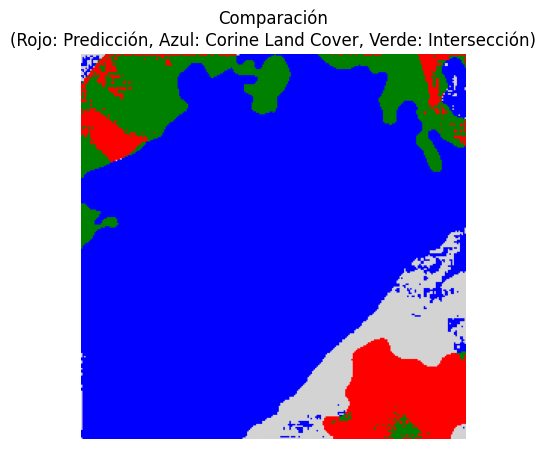

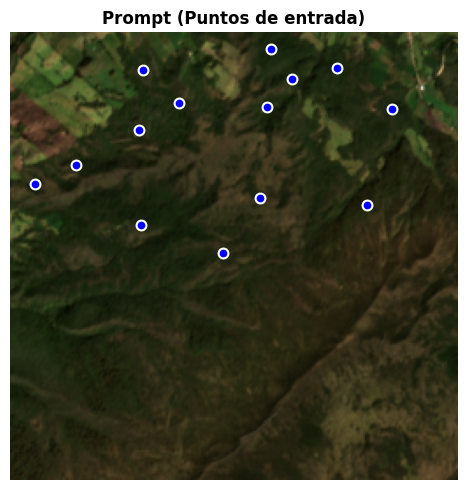


🎯 MÉTRICAS PRINCIPALES:
   • IoU (Intersection over Union): 11.83%
   • DICE Coefficient:              21.16%
   • Pixel Accuracy:                19.42%
   • F1-Score:                      21.16%

📊 SENSIBILIDAD Y ESPECIFICIDAD:
   • TPR (Sensitivity / Recall):    54.55%
   • FPR (False Positive Rate):     89.26%
   • Precision:                     13.12%

🔢 MATRIZ DE CONFUSIÓN:
   • True Positives (TP):           7029
   • False Positives (FP):          46538
   • True Negatives (TN):           5602
   • False Negatives (FN):          5856

############################################################
🔄 Procesando tile 18 con código CORINE 321113
############################################################

📍 SEGMENTACIÓN CON PUNTOS - Tile 18
   • Código CORINE: 321113 - Herbazal denso de tierra firme con arbustos
   • Imagen: ../tiles/Sentinel/Guatavita_18_crop.tif
   • Puntos: ../tiles/Puntos/Guatavita_18_points.geojson

📂 PASO 1: CARGA DE DATOS
   ✅ Cargados 6 puntos

🎯 PASO 2: SEG

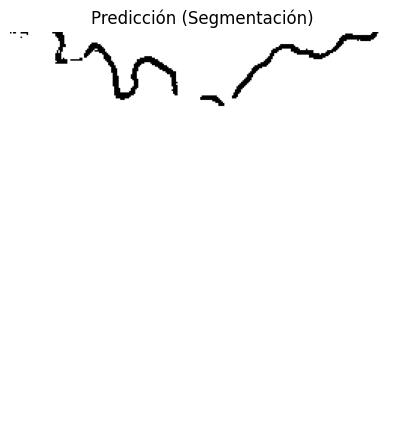

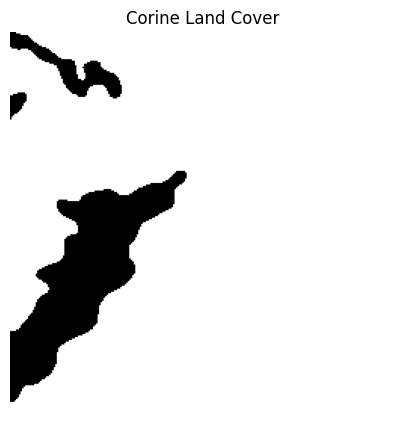

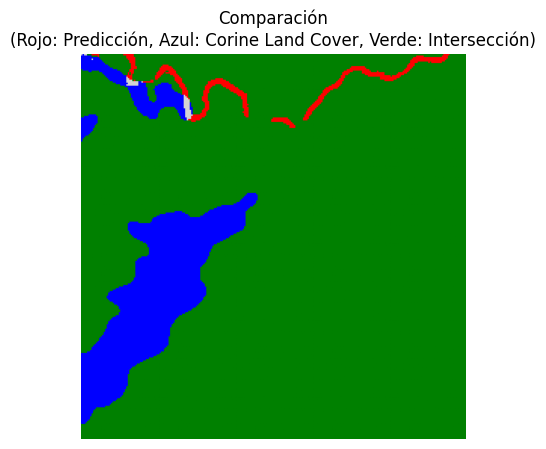

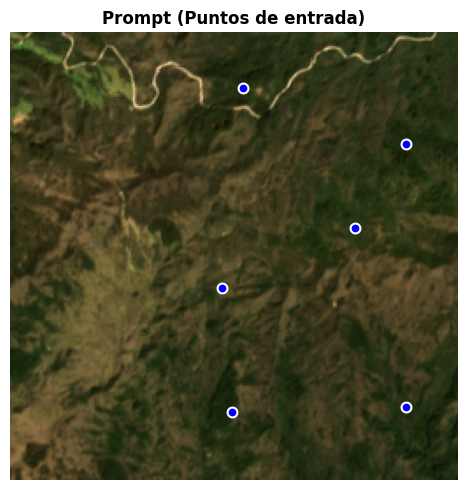


🎯 MÉTRICAS PRINCIPALES:
   • IoU (Intersection over Union): 87.54%
   • DICE Coefficient:              93.36%
   • Pixel Accuracy:                87.56%
   • F1-Score:                      93.36%

📊 SENSIBILIDAD Y ESPECIFICIDAD:
   • TPR (Sensitivity / Recall):    98.40%
   • FPR (False Positive Rate):     98.72%
   • Precision:                     88.80%

🔢 MATRIZ DE CONFUSIÓN:
   • True Positives (TP):           56842
   • False Positives (FP):          7167
   • True Negatives (TN):           93
   • False Negatives (FN):          923

############################################################
🔄 Procesando tile 19 con código CORINE 321113
############################################################

📍 SEGMENTACIÓN CON PUNTOS - Tile 19
   • Código CORINE: 321113 - Herbazal denso de tierra firme con arbustos
   • Imagen: ../tiles/Sentinel/Guatavita_19_crop.tif
   • Puntos: ../tiles/Puntos/Guatavita_19_points.geojson

📂 PASO 1: CARGA DE DATOS
   ✅ Cargados 9 puntos

🎯 PASO 2: SEGMEN

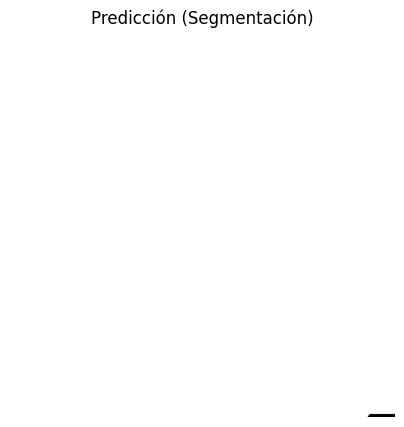

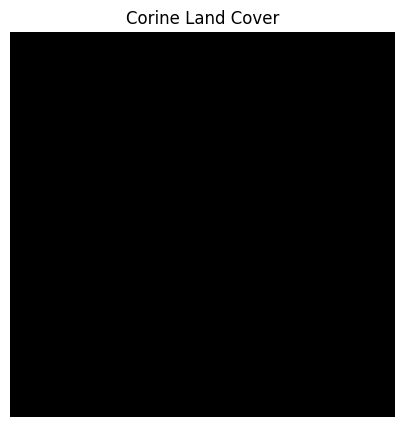

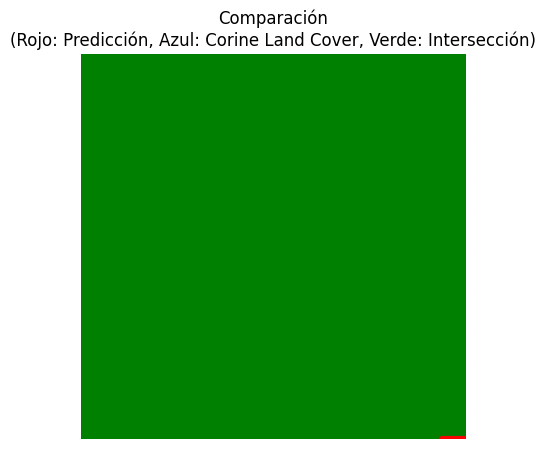

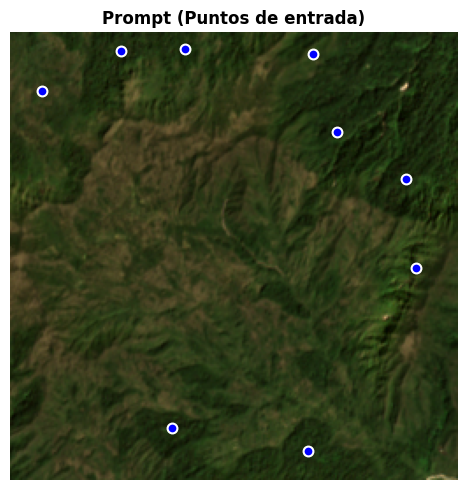


🎯 MÉTRICAS PRINCIPALES:
   • IoU (Intersection over Union): 99.95%
   • DICE Coefficient:              99.97%
   • Pixel Accuracy:                99.95%
   • F1-Score:                      99.97%

📊 SENSIBILIDAD Y ESPECIFICIDAD:
   • TPR (Sensitivity / Recall):    99.95%
   • FPR (False Positive Rate):     0.00%
   • Precision:                     100.00%

🔢 MATRIZ DE CONFUSIÓN:
   • True Positives (TP):           64990
   • False Positives (FP):          0
   • True Negatives (TN):           0
   • False Negatives (FN):          35

############################################################
🔄 Procesando tile 20 con código CORINE 231
############################################################

📍 SEGMENTACIÓN CON PUNTOS - Tile 20
   • Código CORINE: 231 - Pastos limpios
   • Imagen: ../tiles/Sentinel/Guatavita_20_crop.tif
   • Puntos: ../tiles/Puntos/Guatavita_20_points.geojson

📂 PASO 1: CARGA DE DATOS
   ✅ Cargados 26 puntos

🎯 PASO 2: SEGMENTACIÓN CON SAM
   ✅ Generadas 1 máscara

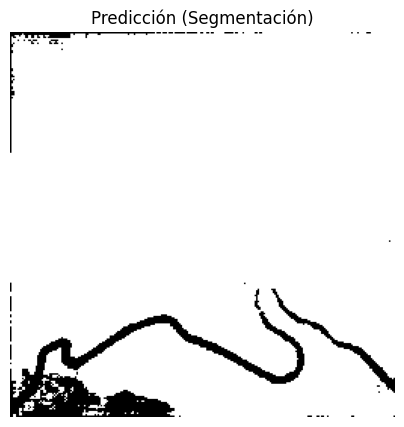

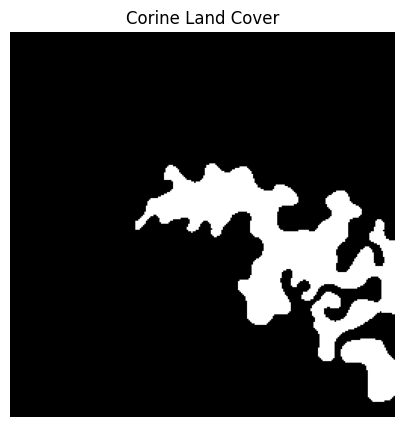

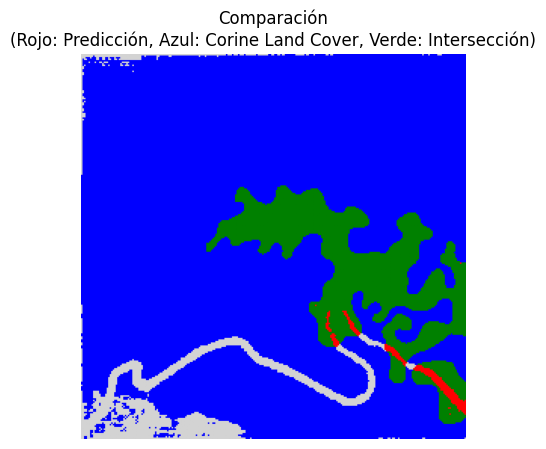

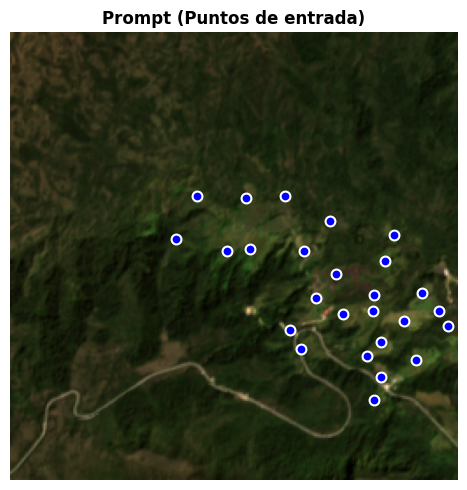


🎯 MÉTRICAS PRINCIPALES:
   • IoU (Intersection over Union): 13.64%
   • DICE Coefficient:              24.01%
   • Pixel Accuracy:                18.58%
   • F1-Score:                      24.01%

📊 SENSIBILIDAD Y ESPECIFICIDAD:
   • TPR (Sensitivity / Recall):    95.36%
   • FPR (False Positive Rate):     93.39%
   • Precision:                     13.73%

🔢 MATRIZ DE CONFUSIÓN:
   • True Positives (TP):           8364
   • False Positives (FP):          52534
   • True Negatives (TN):           3720
   • False Negatives (FN):          407

############################################################
🔄 Procesando tile 21 con código CORINE 231
############################################################

📍 SEGMENTACIÓN CON PUNTOS - Tile 21
   • Código CORINE: 231 - Pastos limpios
   • Imagen: ../tiles/Sentinel/Guatavita_21_crop.tif
   • Puntos: ../tiles/Puntos/Guatavita_21_points.geojson

📂 PASO 1: CARGA DE DATOS
   ✅ Cargados 19 puntos

🎯 PASO 2: SEGMENTACIÓN CON SAM
   ✅ Generadas 1 

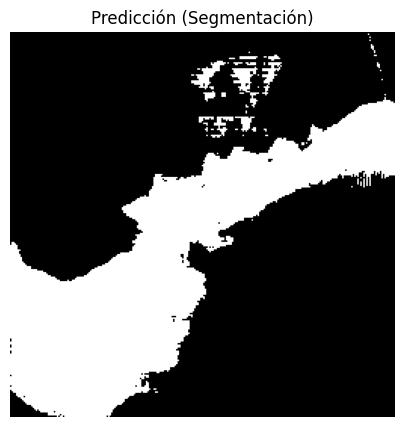

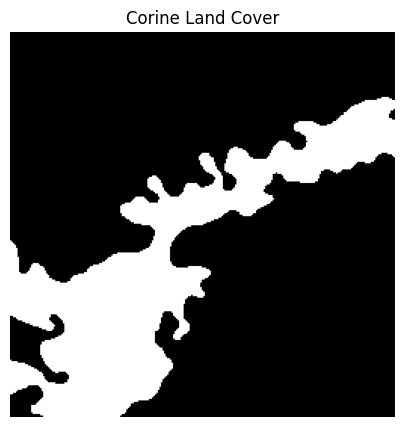

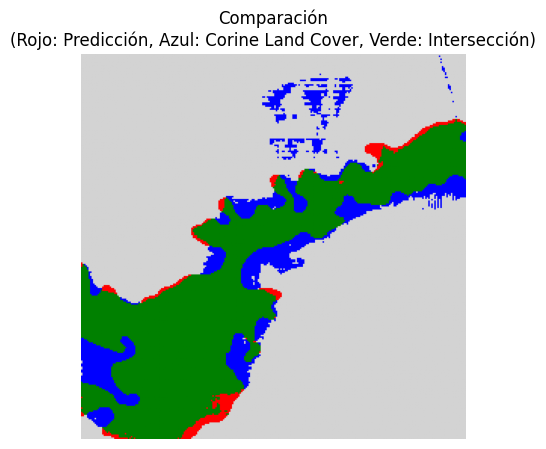

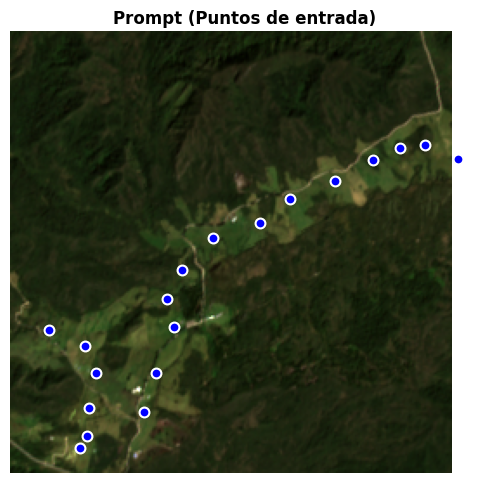


🎯 MÉTRICAS PRINCIPALES:
   • IoU (Intersection over Union): 72.11%
   • DICE Coefficient:              83.80%
   • Pixel Accuracy:                91.36%
   • F1-Score:                      83.80%

📊 SENSIBILIDAD Y ESPECIFICIDAD:
   • TPR (Sensitivity / Recall):    94.19%
   • FPR (False Positive Rate):     9.52%
   • Precision:                     75.47%

🔢 MATRIZ DE CONFUSIÓN:
   • True Positives (TP):           14526
   • False Positives (FP):          4722
   • True Negatives (TN):           44881
   • False Negatives (FN):          896

############################################################
🔄 Procesando tile 22 con código CORINE 231
############################################################

📍 SEGMENTACIÓN CON PUNTOS - Tile 22
   • Código CORINE: 231 - Pastos limpios
   • Imagen: ../tiles/Sentinel/Guatavita_22_crop.tif
   • Puntos: ../tiles/Puntos/Guatavita_22_points.geojson

📂 PASO 1: CARGA DE DATOS
   ✅ Cargados 17 puntos

🎯 PASO 2: SEGMENTACIÓN CON SAM
   ✅ Generadas 1 

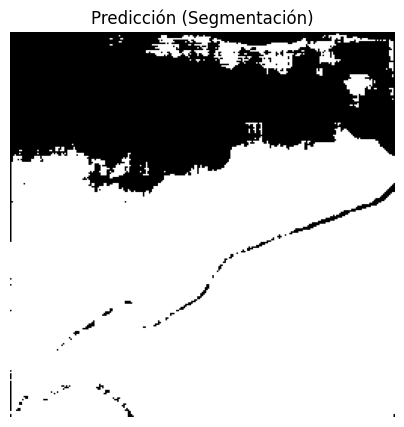

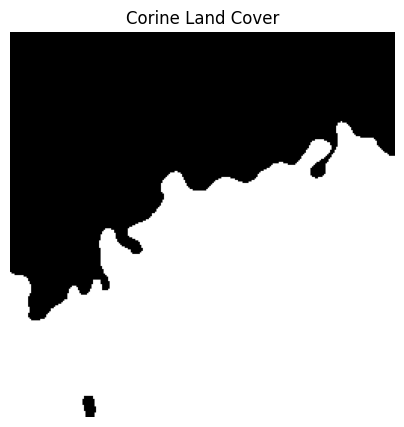

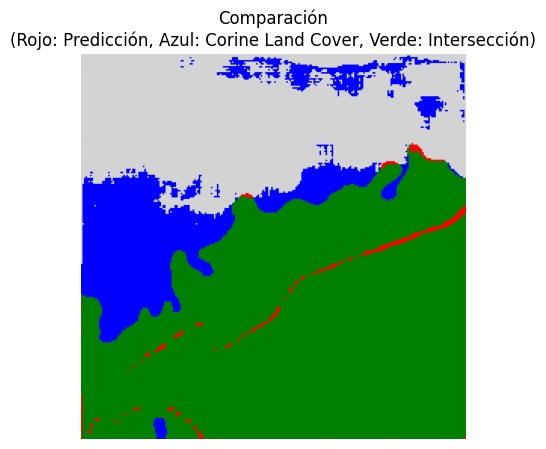

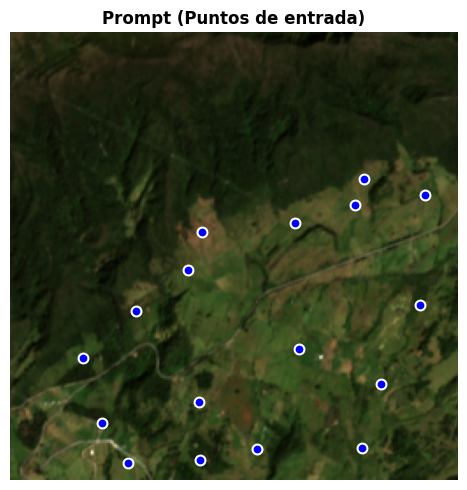


🎯 MÉTRICAS PRINCIPALES:
   • IoU (Intersection over Union): 77.30%
   • DICE Coefficient:              87.19%
   • Pixel Accuracy:                84.15%
   • F1-Score:                      87.19%

📊 SENSIBILIDAD Y ESPECIFICIDAD:
   • TPR (Sensitivity / Recall):    98.33%
   • FPR (False Positive Rate):     33.10%
   • Precision:                     78.32%

🔢 MATRIZ DE CONFUSIÓN:
   • True Positives (TP):           35090
   • False Positives (FP):          9711
   • True Negatives (TN):           19628
   • False Negatives (FN):          596

✅ PROCESAMIENTO FINALIZADO - RESUMEN


ValueError: Invalid format specifier '.4f if iou else 'N/A'' for object of type 'float'

In [12]:
# 📋 CÓDIGOS CORINE PARA EVALUACIÓN
CODIGOS_CORINE = {
    512: "Cuerpos de agua",
    111: "Tejido urbano continuo",
    231: "Pastos limpios",
    321113: "Herbazal denso de tierra firme con arbustos"
}

def geojson_to_raster(geojson_path, reference_tif_path, output_path, codigo_filtro):
    """Convierte un GeoJSON a raster usando un archivo TIFF de referencia"""
    gdf = gpd.read_file(geojson_path)
    gdf_filtrado = gdf[gdf['codigo'] == codigo_filtro]
    
    with rasterio.open(reference_tif_path) as ref:
        transform = ref.transform
        width = ref.width
        height = ref.height
        crs = ref.crs
    
    mask = features.rasterize(
        ((geom, 0) for geom in gdf_filtrado.geometry),
        out_shape=(height, width),
        transform=transform,
        fill=1,
        dtype='uint8'
    )
    
    with rasterio.open(
        output_path, 'w',
        driver='GTiff',
        height=height,
        width=width,
        count=1,
        dtype=mask.dtype,
        crs=crs,
        transform=transform,
    ) as dst:
        dst.write(mask, 1)
    
    return mask

def calculate_metrics(mask_path, land_path, target_value=0):
    """Calcula métricas DICE, IoU, Pixel Accuracy, TPR, FPR, Precision, F1"""
    with rasterio.open(mask_path) as src1:
        raster1 = src1.read(1)
    
    with rasterio.open(land_path) as src2:
        raster2 = src2.read(1)

    mask1 = (raster1 == target_value).astype(int)
    mask2 = (raster2 != target_value).astype(int)
    
    intersection = np.sum(mask1 & mask2)
    union = np.sum(mask1 | mask2)
    sum_masks = np.sum(mask1) + np.sum(mask2)

    FP = np.sum(mask2) - intersection
    FN = np.sum(mask1) - intersection
    TN = mask1.size - intersection - FP - FN

    if union == 0:
        iou = 1.0 if intersection == 0 else 0.0
        dice = 1.0 if sum_masks == 0 else 0.0
    else:
        iou = intersection / union
        dice = (2 * intersection) / sum_masks if sum_masks > 0 else 0.0

    pixel_accuracy = (intersection + TN) / mask1.size
    tpr = intersection / (intersection + FN) if (intersection + FN) > 0 else 0.0
    fpr = FP / (FP + TN) if (FP + TN) > 0 else 0.0
    precision = intersection / (intersection + FP) if (intersection + FP) > 0 else 0.0
    f1_score = 2 * (precision * tpr) / (precision + tpr) if (precision + tpr) > 0 else 0.0

    # Visualización
    comparison = np.zeros_like(mask1)
    comparison[mask1 == 1] = 1
    comparison[mask2 == 1] = 2
    comparison[(mask1 == 1) & (mask2 == 1)] = 3

    import re
    tile_match = re.search(r'Guatavita_(\d+)', mask_path)
    if tile_match:
        tile_num = tile_match.group(1)
        image_path = f'../tiles/Sentinel/Guatavita_{tile_num}_crop.tif'
        points_path = f'../tiles/Puntos/Guatavita_{tile_num}_points.geojson'
        
        # Cargar imagen
        with rasterio.open(image_path) as src:
            img_rgb = src.read([1, 2, 3]).transpose(1, 2, 0)
            # Normalizar para visualización
            img_rgb = (img_rgb - img_rgb.min()) / (img_rgb.max() - img_rgb.min())
        
        # Cargar puntos
        gdf_points = gpd.read_file(points_path)
        if gdf_points.crs is None:
            gdf_points = gdf_points.set_crs("EPSG:4326")
        
        # Convertir puntos a píxeles
        from rasterio.transform import rowcol
        with rasterio.open(image_path) as src:
            lons = gdf_points.geometry.x.values
            lats = gdf_points.geometry.y.values
            rows, cols = rowcol(src.transform, lons, lats)
            point_coords_vis = np.column_stack([cols, rows])
    else:
        img_rgb = None
        point_coords_vis = None

    fig, axes = plt.subplots(1, 1, figsize=(5, 5))
    fig, axes1 = plt.subplots(1, 1, figsize=(5, 5))
    fig, axes2 = plt.subplots(1, 1, figsize=(5, 5))
    fig, axes4 = plt.subplots(1, 1, figsize=(5, 5))

        # Panel 1: Prompt (imagen con puntos)
    if img_rgb is not None and point_coords_vis is not None:
        axes4.imshow(img_rgb)
        axes4.scatter(point_coords_vis[:, 0], point_coords_vis[:, 1], 
                       c='blue', s=50, marker='o', edgecolors='white', linewidths=1.5)
        axes4.set_title('Prompt (Puntos de entrada)', fontsize=12, fontweight='bold')
    else:
        axes4.text(0.5, 0.5, 'Prompt no disponible', ha='center', va='center')
        axes4.set_title('Prompt', fontsize=12, fontweight='bold')
    axes4.axis('off')

    axes.imshow(mask2, cmap='gray')
    axes.set_title('Predicción (Segmentación)')
    axes.axis('off')

    axes1.imshow(mask1, cmap='gray')
    axes1.set_title('Corine Land Cover')
    axes1.axis('off')
    
    colors = ['lightgray', 'red', 'blue', 'green']
    cmap = plt.matplotlib.colors.ListedColormap(colors)
    
    im = axes2.imshow(comparison, cmap=cmap, vmin=0, vmax=3)
    axes2.set_title('Comparación\n(Rojo: Predicción, Azul: Corine Land Cover, Verde: Intersección)')
    axes2.axis('off')
    
    plt.tight_layout()
    plt.show()
    
    return {
        'IoU': iou,
        'DICE': dice,
        'Pixel_Accuracy': pixel_accuracy,
        'TPR_Sensitivity_Recall': tpr,
        'FPR': fpr,
        'Precision': precision,
        'F1_Score': f1_score,
        'TP': intersection,
        'FP': FP,
        'TN': TN,
        'FN': FN
    }

def print_metrics_percent(results):
    """Imprime las métricas en formato porcentaje"""
    if results is None:
        print("No hay resultados para mostrar.")
        return

    def pct(x):
        return f"{x*100:.2f}%" if x is not None else "N/A"

    print(f"\n🎯 MÉTRICAS PRINCIPALES:")
    print(f"   • IoU (Intersection over Union): {pct(results.get('IoU'))}")
    print(f"   • DICE Coefficient:              {pct(results.get('DICE'))}")
    print(f"   • Pixel Accuracy:                {pct(results.get('Pixel_Accuracy'))}")
    print(f"   • F1-Score:                      {pct(results.get('F1_Score'))}")

    print(f"\n📊 SENSIBILIDAD Y ESPECIFICIDAD:")
    print(f"   • TPR (Sensitivity / Recall):    {pct(results.get('TPR_Sensitivity_Recall'))}")
    print(f"   • FPR (False Positive Rate):     {pct(results.get('FPR'))}")
    print(f"   • Precision:                     {pct(results.get('Precision'))}")

    print(f"\n🔢 MATRIZ DE CONFUSIÓN:")
    print(f"   • True Positives (TP):           {int(results.get('TP', 0))}")
    print(f"   • False Positives (FP):          {int(results.get('FP', 0))}")
    print(f"   • True Negatives (TN):           {int(results.get('TN', 0))}")
    print(f"   • False Negatives (FN):          {int(results.get('FN', 0))}")

def segment_with_points_and_evaluate(tile_number, codigo_corine):
    """
    Segmentación automática con puntos y evaluación de métricas
    
    Args:
        tile_number (int): Número del tile (0-22)
        codigo_corine (int): Código CORINE Land Cover a evaluar
    
    Returns:
        dict: Métricas de evaluación
    """
    # Generar nombres de archivos
    base_name = f"Guatavita_{tile_number}"
    
    # Rutas de entrada
    image_path = f'../tiles/Sentinel/{base_name}_crop.tif'
    point_coords_path = f'../tiles/Puntos/{base_name}_points.geojson'
    geojson_path = f'../tiles/LandUse/{base_name}_crop.geojson'
    
    # Rutas de salida
    segmentation_output = f'../tiles/segmentation_points/{base_name}_points_mask.tif'
    landuse_raster_output = f'../tiles/LandUseRaster/{base_name}_codigo{codigo_corine}_raster.tif'
    
    # Crear directorios
    os.makedirs('../tiles/segmentation_points', exist_ok=True)
    os.makedirs('../tiles/LandUseRaster', exist_ok=True)
    
    # Verificar archivos de entrada
    if not os.path.exists(image_path):
        print(f"❌ Error: No se encuentra {image_path}")
        return None
    
    if not os.path.exists(point_coords_path):
        print(f"❌ Error: No se encuentra {point_coords_path}")
        return None
    
    print(f"\n{'='*60}")
    print(f"📍 SEGMENTACIÓN CON PUNTOS - Tile {tile_number}")
    print(f"{'='*60}")
    print(f"   • Código CORINE: {codigo_corine} - {CODIGOS_CORINE.get(codigo_corine, 'Desconocido')}")
    print(f"   • Imagen: {image_path}")
    print(f"   • Puntos: {point_coords_path}")
    
    # PASO 1: Cargar imagen y puntos
    print(f"\n📂 PASO 1: CARGA DE DATOS")
    
    # Crear predictor usando la variable global 'sam'
    predictor = SamPredictor(sam)
    
    with rasterio.open(image_path) as src:
        image = src.read().transpose(1, 2, 0)
        raster_crs = src.crs
        profile = src.profile.copy()
    
    predictor.set_image(image)
    
    # Leer puntos del GeoJSON
    gdf = gpd.read_file(point_coords_path)
    if gdf.crs is None:
        gdf = gdf.set_crs("EPSG:4326")
    
    # Convertir coordenadas geográficas a píxeles
    from rasterio.transform import rowcol
    with rasterio.open(image_path) as src:
        lons = gdf.geometry.x.values
        lats = gdf.geometry.y.values
        rows, cols = rowcol(src.transform, lons, lats)
        point_coords = np.column_stack([cols, rows])
    
    print(f"   ✅ Cargados {len(point_coords)} puntos")
    
    # PASO 2: Segmentación
    print(f"\n🎯 PASO 2: SEGMENTACIÓN CON SAM")
    masks, scores, logits = predictor.predict(
        point_coords=point_coords,
        point_labels=np.ones(len(point_coords), dtype=int),
        multimask_output=True
    )
    
    print(f"   ✅ Generadas {masks.shape[0]} máscaras con scores: {scores}")
    
    # Seleccionar mejor máscara
    best_mask_idx = np.argmax(scores)
    best_mask = (masks[best_mask_idx] > 0.5).astype(np.uint8) * 255
    
    # Guardar máscara
    profile.update(dtype=rasterio.uint8, count=1)
    
    with rasterio.open(segmentation_output, 'w', **profile) as dst:
        dst.write(best_mask, 1)
    
    print(f"   💾 Máscara guardada: {segmentation_output}")
    
    # PASO 3: Convertir GeoJSON a raster
    print(f"\n🗺️ PASO 3: CONVERSIÓN GEOJSON A RASTER")
    geojson_to_raster(
        geojson_path=geojson_path,
        reference_tif_path=image_path,
        output_path=landuse_raster_output,
        codigo_filtro=codigo_corine
    )
    print(f"   ✅ Ground truth generado: {landuse_raster_output}")
    
    # PASO 4: Calcular métricas
    print(f"\n📊 PASO 4: CÁLCULO DE MÉTRICAS")
    results = calculate_metrics(
        mask_path=landuse_raster_output,
        land_path=segmentation_output,
        target_value=0
    )
    
    print_metrics_percent(results)
    
    return results

# 📋 PARES TILE-CÓDIGO CORINE
pairs = [
    {0:512}, {1:512}, {2:512}, {3:512}, {4:111}, {5:231}, {6:231},
    {7:321113}, {8:321113}, {9:321113}, {10:321113}, {11:321113},
    {12:321113}, {13:231}, {14:321113}, {15:231}, {16:231}, {17:231},
    {18:321113}, {19:321113}, {20:231}, {21:231}, {22:231}
]

# Normalizar a lista de tuplas
tiles_codes = []
for p in pairs:
    if isinstance(p, dict):
        for k, v in p.items():
            tiles_codes.append((int(k), int(v)))

# PROCESAMIENTO AUTOMÁTICO
results_all = {}
for tile, code in tiles_codes:
    print(f"\n{'#'*60}")
    print(f"🔄 Procesando tile {tile} con código CORINE {code}")
    print(f"{'#'*60}")
    
    try:
        res = segment_with_points_and_evaluate(tile, code)
        results_all[f"tile_{tile}"] = {
            "codigo": code,
            "descripcion": CODIGOS_CORINE.get(code, "Desconocido"),
            "results": res
        }
    except Exception as e:
        print(f"❌ Error procesando tile {tile}: {e}")

# RESUMEN FINAL
print(f"\n{'='*60}")
print(f"✅ PROCESAMIENTO FINALIZADO - RESUMEN")
print(f"{'='*60}")
for k, v in results_all.items():
    iou = v["results"].get("IoU") if v["results"] else None
    print(f"{k} -> {v['descripcion']} (código {v['codigo']}) | IoU: {iou:.4f if iou else 'N/A'}")